<a href="https://colab.research.google.com/github/KenMuriuki/Hass-Housing-Prediction/blob/master/Kennedy_Muriuki_Week_7_Independent_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Moringa School Independent Project Week 7

## Defining the question

### a) Specifying the question

You, as a data scientist working with Hass Consultants(a real estate firm), have been tasked to study the factors that affect housing prices using the given information on real estate properties that was collected over the past few months. Later onwards, you will create a model that allows the company to accurately predict the prices of houses upon being provided with the predictor variables. 

### b) Defining the metric of success

The metric of success that will be used will be the MSE. The lowest MSE of the various model predictions will be the most accurate at predicting the house prices. This study aims at improving the accuracy of the model by optimizing the MSE.

### c) Understanding the context

The context of the study is to enable the company to better predict the prices of houses.

### d) understanding the experimental design

Begin by reading about the field of study and fill in knowledge gaps, I will be conversant with the experimental design of the study. 

### e) appropriateness of the data

The data will be appropriate if the independent variables can accurately predict the dependent variable which is price to a high degree of accuracy preferable above 75%.

## Reading the data

In [27]:
# importing the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn import linear_model
from sklearn import model_selection
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [10]:
# loading the dataset
hass = pd.read_csv('house_data.csv')
hass.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Checking the data

In [ ]:
# checking the tail of the dataset
hass.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   price          21613 non-null  float64
 2   bedrooms       21613 non-null  int64  
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  int64  
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     21613 non-null  int64  
 8   view           21613 non-null  int64  
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  int64  
 11  sqft_above     21613 non-null  int64  
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  zipcode        21613 non-null  int64  
 16  lat            21613 non-null  float64
 17  long           21613 non-null  float64
 18  sqft_l

In [ ]:
# checking for the missing values
hass.isnull().sum()

id               0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

Our dataset does not contain any missing values

## External data source validation

## Tidying the dataset

In [ ]:
# checking the data types
hass.dtypes


id                 int64
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [11]:
# removing the attributes that are irrelevant
hass.drop(['id','lat','yr_renovated','long'], inplace=True, axis=1)
hass.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,98178,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,98125,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,98028,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,98136,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,98074,1800,7503


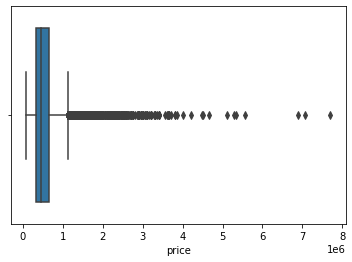

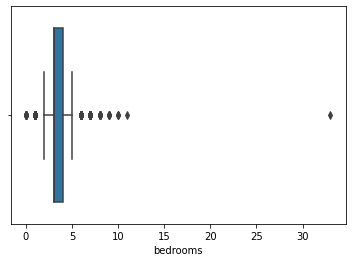

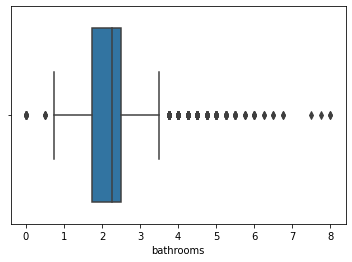

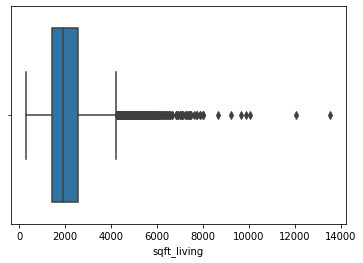

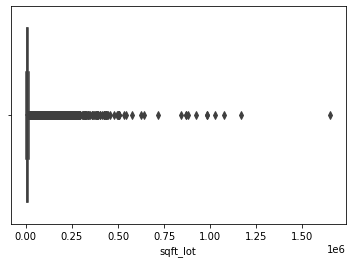

...

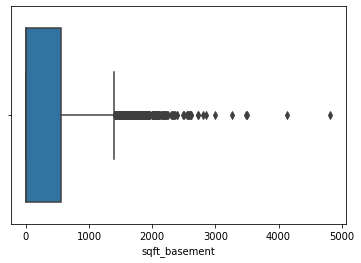

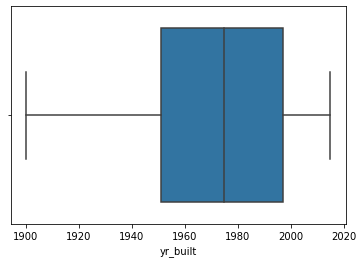

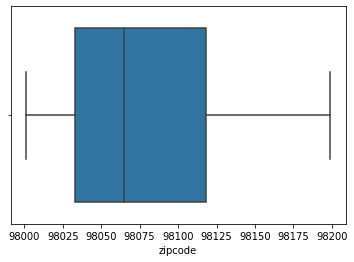

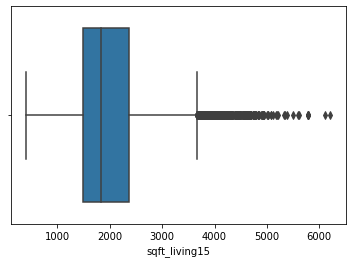

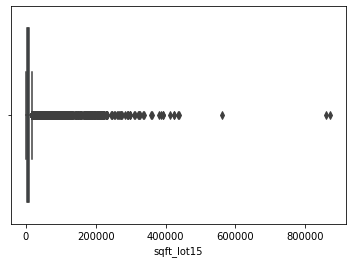

In [ ]:
#checking for outliers in the data
for column in hass:
  plt.figure()
  sns.boxplot(hass[column])

most of the columns in the data have outliers except floors, condition, yr_built and zipcode. The outliers in this data will not be removed since they make sense in the housing market.

## Performing EDA

The countplots below largely represents categorical variables that are ordinal. They show the different values in each column and their frequencies.

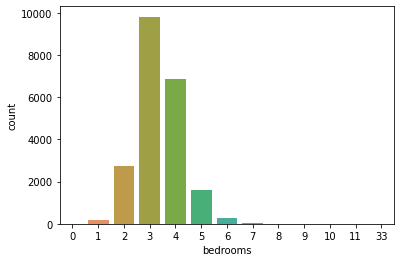

In [ ]:
# countplot for bedrooms

sns.countplot(x=hass['bedrooms'])

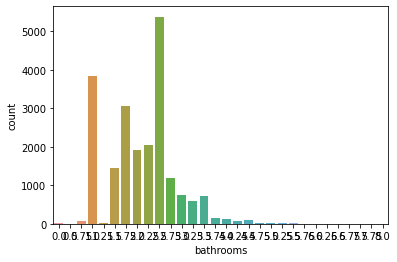

In [ ]:
# countplot for bathrooms
sns.countplot(x=hass['bathrooms'])

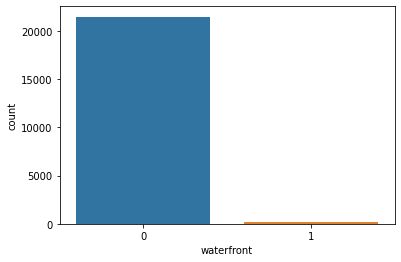

In [ ]:
# countplot for waterfront
sns.countplot(x=hass['waterfront'])

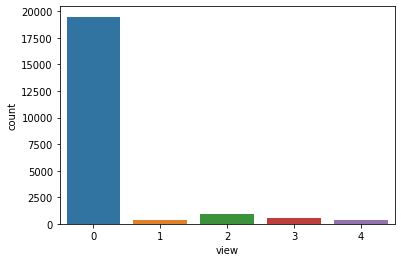

In [ ]:
# countplot for view
sns.countplot(x=hass['view'])

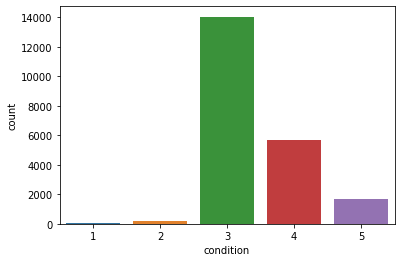

In [ ]:
# countplot for condition
sns.countplot(x=hass['condition'])

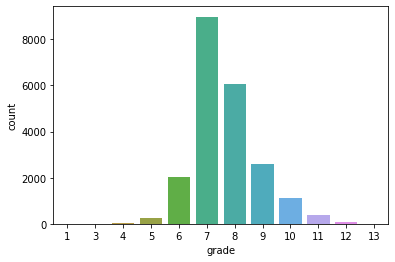

In [ ]:
# countplot for grade
sns.countplot(x=hass['grade'])

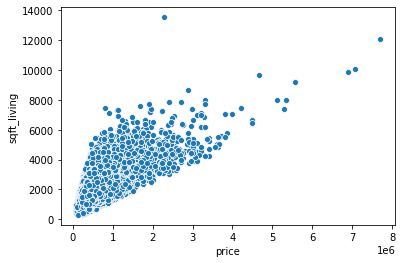

In [ ]:
# compare price against square foot living
sns.scatterplot(x=hass['price'], y=hass['sqft_living'])


The scatter plot shows that price and sqft_living have a relatively linear relationship.

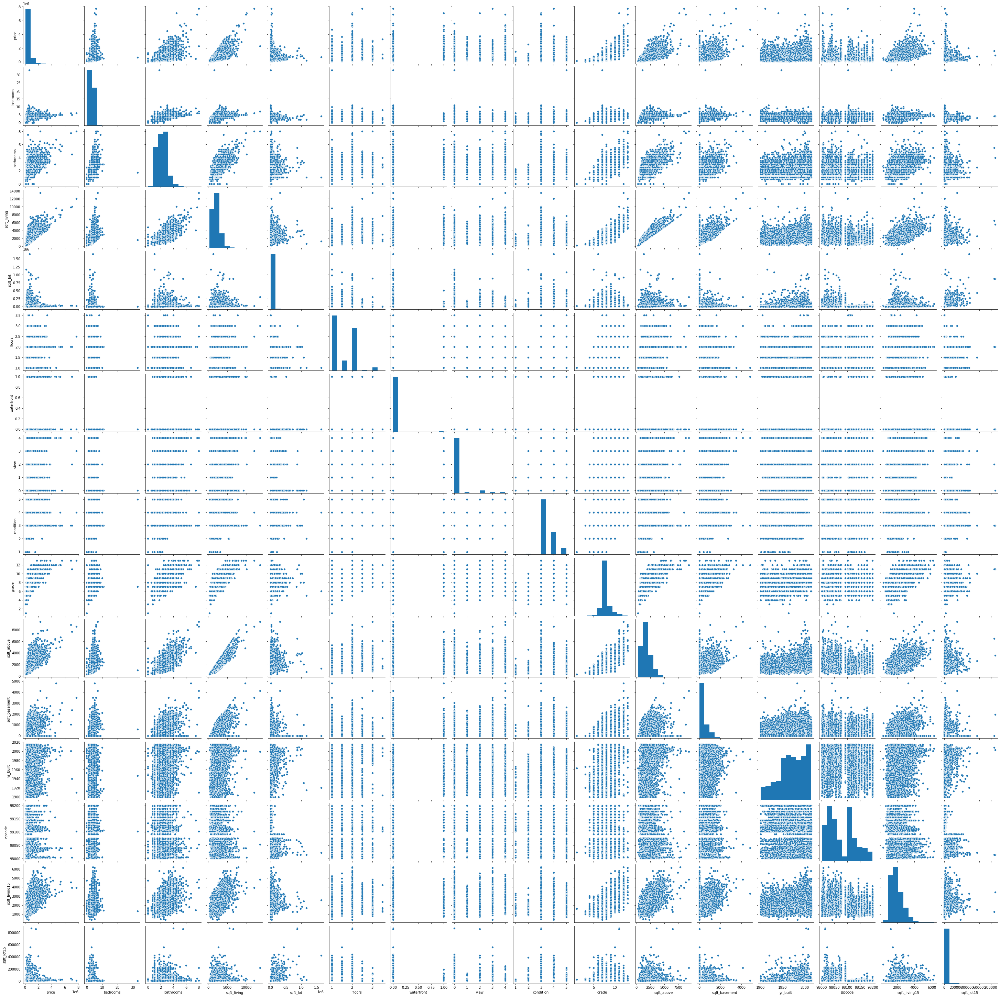

In [ ]:
# plotting a pairplot for the data
sns.pairplot(hass)
plt.show()

In [ ]:
# checking for the correlation of the data
hass.corr()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,sqft_living15,sqft_lot15
price,1.000000,0.308338,0.525134,0.702044,0.089655,0.256786,0.266331,0.397346,0.036392,0.667463,0.605566,0.323837,0.053982,-0.053168,0.585374,0.082456
bedrooms,0.308338,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,-0.152668,0.391638,0.029244
bathrooms,0.525134,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,-0.203866,0.568634,0.087175
sqft_living,0.702044,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,-0.199430,0.756420,0.183286
sqft_lot,0.089655,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,-0.129574,0.144608,0.718557
floors,0.256786,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,-0.059121,0.279885,-0.011269
waterfront,0.266331,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.030285,0.086463,0.030703
view,0.397346,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.084827,0.280439,0.072575
condition,0.036392,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,0.003026,-0.092824,-0.003406
grade,0.667463,0.356967,0.664983,0.762704,0.113621,0.458183,0.082775,0.251321,-0.144674,1.000000,0.755923,0.168392,0.446963,-0.184862,0.713202,0.119248


Most of the variables have weak positive and negative correlation. There are a few exceptions like bathrooms and sft_living that have strong positive correlations. These variables are likely to introduce multicollinearity in our model.

In [ ]:
# generating a pandas profile report using pandas profiler
!pip install -U pandas-profiling
from pandas_profiling import ProfileReport

ProfileReport(hass, title= 'Hass Housing Profile Report')

Requirement already up-to-date: pandas-profiling in /usr/local/lib/python3.6/dist-packages (2.8.0)


## Multiple Linear regression 

In [84]:
# building our base model for the multiple linear regression
from sklearn.model_selection import train_test_split

x = hass.drop(['price'], axis=1).values
y = hass['price'].values

# using 80% to train the data
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=0)

# finding the optimal coefficients and intercepts
from sklearn.linear_model import LinearRegression

regressor = LinearRegression()
regressor.fit(x_train,y_train)

# printing the coefficients of each variable used
print(regressor.coef_)

# comparing the predicted results from the test results in the dataset
y_pred = regressor.predict(x_test)

# creating a pandas dataframe to compare the predicted results against the actual results
comparison_df = pd.DataFrame({'Actual':y_test.flatten(), 'Predicted': y_pred.flatten()})
comparison_df.describe()

[-3.79052032e+04  4.51530781e+04  1.11524445e+02  2.61412660e-02
  2.89860354e+04  6.04347594e+05  4.34336317e+04  1.85590987e+04
  1.17766453e+05  5.30390542e+01  5.84853910e+01 -3.61706211e+03
  2.75235403e+01  2.66232566e+01 -6.02803782e-01]


,Actual,Predicted
count,4.323000e+03,4.323000e+03
mean,5.293396e+05,5.347332e+05
std,3.451267e+05,2.891624e+05
min,8.900000e+04,-3.806483e+05
25%,3.170000e+05,3.341065e+05
50%,4.400000e+05,4.730931e+05
75%,6.317500e+05,6.714644e+05
max,5.570000e+06,2.377544e+06


In the base model, We obtain the coefficients for the variables. There are variables with high coefficients such as the floors and the grade of the house which contain 7.5 and 9.4 respectively. This means that for a unit change in the floor of the house, the price of the house changes by 7.5 units and similary to the house grade.
As we can see the mean and standard deviation of the actual VS predicted models is almost the same. However, certain variables differ like the min and max. Therefore we need to perform feature extraction in order to build a more accurate model

In [85]:
# Generating key metrics to determine the accuracy of the base model
print('The mean absolute error for the base model is', metrics.mean_absolute_error(y_test,y_pred))
print('The mean squared error for the base model is', metrics.mean_squared_error(y_test, y_pred))
print('The root mean squared error for the base model is', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

The mean absolute error for the base model is 136007.20304340986
The mean squared error for the base model is 42233864419.80855
The root mean squared error for the base model is 205508.79402061738


Assessing the heteroskedasticity using bartlets test and plotting the residuals

                  0
count  4.323000e+03
mean   5.393551e+03
std    2.054618e+05
min   -3.192456e+06
25%   -8.545651e+04
50%    1.225967e+04
75%    1.111592e+05
max    1.063875e+06
inf
1.0901483549464736e-109
the variances are homogeneous!


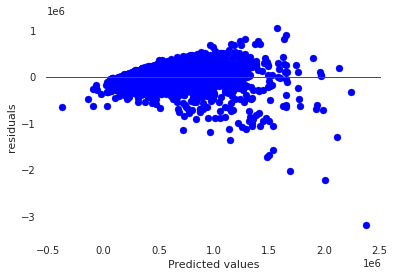

In [86]:
import scipy as sp

residuals = np.subtract(y_pred, y_test)

# describing the residual:
print(pd.DataFrame(residuals).describe())

residuals.mean()

test_result, p_value = sp.stats.bartlett(y_pred, residuals)

# compute the critical value of the chi squared distribution
degree_of_freedom = len(y_pred)-1
probability = 1 - p_value

critical_value = sp.stats.chi2.ppf(probability, degree_of_freedom)
print(critical_value)
print(p_value)

# If the test_result is greater than the critical value, then we reject our null
# hypothesis. This would mean that there are patterns to the variance of the data

# Otherwise, if we can identify no patterns, and we accept the null hypothesis that 
# the variance is homogeneous across our data

if (test_result > critical_value):
  print('the variances are unequal, and the model should be reassessed')
else:
  print('the variances are homogeneous!')

# plotting the residuals
plt.scatter(y_pred, residuals, color='blue')
plt.ylabel('residuals')
plt.xlabel('Predicted values')
plt.axhline(y= residuals.mean(), color='red', linewidth=1)
plt.show()

To improve the model, we check if there is multicollinearity in the dataset.

In [ ]:
# first I isolate the independent variables and identify the correlations
independent = hass.drop(['price'], axis=1)
correlations = independent.corr()
print(correlations)

# checking the VIF scores
pd.DataFrame(np.linalg.inv(correlations.values), index=correlations.index, columns=correlations.columns)

               bedrooms  bathrooms  ...  sqft_living15  sqft_lot15
bedrooms       1.000000   0.515884  ...       0.391638    0.029244
bathrooms      0.515884   1.000000  ...       0.568634    0.087175
sqft_living    0.576671   0.754665  ...       0.756420    0.183286
sqft_lot       0.031703   0.087740  ...       0.144608    0.718557
floors         0.175429   0.500653  ...       0.279885   -0.011269
waterfront    -0.006582   0.063744  ...       0.086463    0.030703
view           0.079532   0.187737  ...       0.280439    0.072575
condition      0.028472  -0.124982  ...      -0.092824   -0.003406
grade          0.356967   0.664983  ...       0.713202    0.119248
sqft_above     0.477600   0.685342  ...       0.731870    0.194050
sqft_basement  0.303093   0.283770  ...       0.200355    0.017276
yr_built       0.154178   0.506019  ...       0.326229    0.070958
zipcode       -0.152668  -0.203866  ...      -0.279033   -0.147221
sqft_living15  0.391638   0.568634  ...       1.000000    0.18

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,sqft_living15,sqft_lot15
bedrooms,1.647925,-0.450148,-1.948535e-01,0.047998,0.056095,0.064968,0.109673,-0.061331,0.318766,-6.997569e-01,-3.874039e-01,0.107340,0.082266,0.030065,0.086788
bathrooms,-0.450148,3.290498,-5.051387e+00,-0.015167,-0.699735,-0.005230,-0.049334,-0.089079,-0.300473,3.294846e+00,1.345351e+00,-0.797883,0.026767,0.119696,0.070853
sqft_living,-0.196996,-5.053018,-3.387473e+13,-0.132448,0.534700,0.458281,-0.591129,-0.376416,-0.753273,3.054236e+13,1.632343e+13,1.602583,-0.095174,-1.011104,-0.196484
sqft_lot,0.047998,-0.015167,-1.321062e-01,2.090790,0.062854,0.029759,-0.057990,0.024763,-0.012358,-1.114958e-01,3.472787e-02,0.043828,0.060458,0.141284,-1.471755
floors,0.056095,-0.699735,5.309336e-01,0.062854,1.980760,-0.010638,-0.037346,0.109388,-0.300442,-9.380888e-01,3.376756e-01,-0.375909,-0.259459,0.298708,0.088174
waterfront,0.064968,-0.005230,4.586279e-01,0.029759,-0.010638,1.199561,-0.497221,-0.001614,0.043584,-5.229924e-01,-2.266215e-01,0.012612,0.018004,0.066147,-0.017911
view,0.109673,-0.049334,-5.912363e-01,-0.057990,-0.037346,-0.497221,1.418021,-0.020218,-0.170249,5.685443e-01,3.015651e-02,0.160860,-0.139006,-0.296364,-0.005125
condition,-0.061331,-0.089079,-3.769628e-01,0.024763,0.109388,-0.001614,-0.020218,1.209716,-0.027689,3.885151e-01,8.989240e-02,0.453916,0.166301,0.064151,-0.025377
grade,0.318766,-0.300473,-7.483319e-01,-0.012358,-0.300442,0.043584,-0.170249,-0.027689,3.248737,-8.198937e-01,-1.772006e-01,-0.434170,-0.142504,-0.861298,0.112703
sqft_above,-0.700769,3.294220,3.054236e+13,-0.110984,-0.940391,-0.522701,0.568380,0.387936,-0.814873,-2.753782e+13,-1.471765e+13,-1.051006,0.185410,-0.673262,-0.032926


sq_living, sq_above, sq_basement are the variables with the highest VIF scores hence they ill be removed. Then I will run the test again to see if the vif scores will improve.

In [ ]:
# removing the highlighted variables
ind_new = hass.drop(['price','sqft_living','sqft_above','sqft_basement'], axis=1)
correlations = ind_new.corr()
print(correlations)

# checking the VIF scores again
pd.DataFrame(np.linalg.inv(correlations.values), index=correlations.index, columns=correlations.columns)

               bedrooms  bathrooms  ...  sqft_living15  sqft_lot15
bedrooms       1.000000   0.515884  ...       0.391638    0.029244
bathrooms      0.515884   1.000000  ...       0.568634    0.087175
sqft_lot       0.031703   0.087740  ...       0.144608    0.718557
floors         0.175429   0.500653  ...       0.279885   -0.011269
waterfront    -0.006582   0.063744  ...       0.086463    0.030703
view           0.079532   0.187737  ...       0.280439    0.072575
condition      0.028472  -0.124982  ...      -0.092824   -0.003406
grade          0.356967   0.664983  ...       0.713202    0.119248
yr_built       0.154178   0.506019  ...       0.326229    0.070958
zipcode       -0.152668  -0.203866  ...      -0.279033   -0.147221
sqft_living15  0.391638   0.568634  ...       1.000000    0.183192
sqft_lot15     0.029244   0.087175  ...       0.183192    1.000000

[12 rows x 12 columns]


,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,yr_built,zipcode,sqft_living15,sqft_lot15
bedrooms,1.454635,-0.785120,0.011470,0.078024,0.048786,0.077649,-0.067837,0.031029,0.207164,0.073463,-0.257546,0.050772
bathrooms,-0.785120,2.629662,-0.058611,-0.489706,-0.022184,-0.160618,-0.124440,-0.741640,-0.606477,-0.031531,-0.293061,0.022747
sqft_lot,0.011470,-0.058611,2.078978,0.024471,0.023959,-0.050251,0.029488,-0.080944,0.058141,0.069434,0.065753,-1.482099
floors,0.078024,-0.489706,0.024471,1.609870,-0.032550,0.085754,0.161706,-0.390904,-0.426662,-0.166283,0.147861,0.061615
waterfront,0.048786,-0.022184,0.023959,-0.032550,1.196675,-0.492201,0.001166,0.011560,0.018427,0.023209,0.030242,-0.022902
view,0.077649,-0.160618,-0.050251,0.085754,-0.492201,1.373974,-0.038023,-0.178000,0.190185,-0.170356,-0.284517,-0.001155
condition,-0.067837,-0.124440,0.029488,0.161706,0.001166,-0.038023,1.202275,-0.020138,0.462797,0.153099,0.080158,-0.022299
grade,0.031029,-0.741640,-0.080944,-0.390904,0.011560,-0.178000,-0.020138,2.779262,-0.298744,-0.124806,-1.350758,0.048849
yr_built,0.207164,-0.606477,0.058141,-0.426662,0.018427,0.190185,0.462797,-0.298744,1.941583,0.508482,0.094799,-0.057220
zipcode,0.073463,-0.031531,0.069434,-0.166283,0.023209,-0.170356,0.153099,-0.124806,0.508482,1.278616,0.353965,0.063204


The model above needs to be optimised in order to obtain a perfect model for the data. The optimization feature that will be used is the RFE and will select the 5 best features.

In [23]:
# performing feature selection to obtain 5 features that have the most effect on the dependent variable
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline

x = hass.drop(['price','sqft_living','sqft_above','sqft_basement'], axis=1)
y = hass['price']

model = DecisionTreeRegressor()
rfe = RFE(model,5)
pipeline = Pipeline(steps=[('s',rfe),('m',model)])

# fit the model
fit = pipeline.fit(x,y)

print('Number of features: %s' %(rfe.n_features_))
print('Selected features: %s' %(rfe.support_))
print('Feature ranking: %s' %(rfe.ranking_))

Number of features: 5
Selected features: [False False  True False False False False  True  True  True  True False]
Feature ranking: [7 2 1 8 4 5 6 1 1 1 1 3]


The feature elimination shows the 5 features that have been selected for the model. These features are the ones that have the biggest effect on the price of the houses. These are sqft_lot, sqft_living15, zipcode, yr_built and grade.

In [37]:
# running the regression using the optimized features
x_lin = hass[['sqft_lot', 'sqft_living15', 'zipcode', 'yr_built', 'grade']]
y_lin = hass['price']

# scaling the data
scaler = StandardScaler()
scaler.fit_transform(x_lin)

# splitting the data into train and test datasets
x_train, x_test, y_train, y_test = train_test_split(x_lin,y_lin, test_size=0.2, random_state=0)
regressor = LinearRegression(normalize=True)  
regressor.fit(x_train, y_train)

# printing the coefficients of each variable used
print(regressor.coef_)

# comparing the predicted results from the test results in the dataset
y_pred = regressor.predict(x_test)

# creating a pandas dataframe to compare the predicted results against the actual results
comparison_df = pd.DataFrame({'Actual':y_test, 'Predicted': y_pred.flatten()})
comparison_df.describe()


[ 1.88025900e-02  1.29943160e+02  2.23255713e+02 -3.77450066e+03
  2.00268218e+05]


,Actual,Predicted
count,4.323000e+03,4.323000e+03
mean,5.293396e+05,5.383482e+05
std,3.451267e+05,2.737380e+05
min,8.900000e+04,-3.178275e+05
25%,3.170000e+05,3.520208e+05
50%,4.400000e+05,4.837646e+05
75%,6.317500e+05,6.692946e+05
max,5.570000e+06,1.915892e+06


In [38]:
# Generating key metrics to determine the accuracy of the base model
print('The mean absolute error for the base model is', metrics.mean_absolute_error(y_test,y_pred))
print('The mean squared error for the base model is', metrics.mean_squared_error(y_test, y_pred))
print('The root mean squared error for the base model is', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

The mean absolute error for the base model is 149659.84086765372
The mean squared error for the base model is 52151771740.24274
The root mean squared error for the base model is 228367.62410692708


After tuning the features and removing the variables that have multicollinearity, the model has a reduced accuracy. This is evident by the increase in the MSE and RMSE. Therefore we continue to other regression methods to try and buid the predictive model.

## Quantile regression 

In [ ]:
# building the base model for the quantile regression
# splitting the dataset into x and y
X = hass.drop(['price'], axis=1)
y = hass['price']
# prepare the quantile that we want to work with
import statsmodels.formula.api as smf

quantiles = np.arange(0.1,1,0.1)
models = []
params = []
# loop to change the columns
for i in np.arange(0,15,1):
  x = X.iloc[:,i]
  mod = smf.quantreg('y ~ x', hass)
  # loop to calculate the quantile data
  for qt in quantiles:
    #mod = smf.quantreg('y ~ x', df)
    res = mod.fit(q = qt)
    models.append(res)
    params.append([qt, res.params['Intercept'], res.params['x']] + res.conf_int().loc['x'].tolist())
params = pd.DataFrame(data = params, columns = ['qt', 'intercept', 'x_coef', 'cf_lower_bound', 'cf_upper_bound'])
print(params)


      qt      intercept        x_coef  cf_lower_bound  cf_upper_bound
0    0.1  119799.999998  40050.000001    37229.863749    42870.136252
1    0.2  134999.999998  50000.000001    47090.040224    52909.959778
2    0.3  149999.999997  61000.000001    57588.467088    64411.532913
3    0.4  165000.000001  72500.000000    68715.999777    76284.000222
4    0.5  179999.999994  85000.000002    81011.089434    88988.910569
..   ...            ...           ...             ...             ...
130  0.5  440829.207922      0.870920        0.733286        1.008554
131  0.6  504180.430028      0.982373        0.819189        1.145556
132  0.7  577003.532738      1.287927        1.115643        1.460210
133  0.8  639915.206476      1.986693        1.809445        2.163942
134  0.9  801145.825507      4.276854        4.060821        4.492886

[135 rows x 5 columns]


In [ ]:
print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:             0.004306
Model:                       QuantReg   Bandwidth:                   3.411e+04
Method:                 Least Squares   Sparsity:                    2.400e+06
Date:                Fri, 31 Jul 2020   No. Observations:                21613
Time:                        12:04:45   Df Residuals:                    21611
                                        Df Model:                            1
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.011e+05   5430.874    147.517      0.000    7.91e+05    8.12e+05
x              4.2769      0.110     38.804      0.000       4.061       4.493

The condition number is large, 3.33e+04. This might indicate that there are
strong multicollinearity or other numerical problems.


## Ridge regression 

In [47]:
# to build my base model, I first split the dataset into x and y
x = hass.drop(['price'], axis=1).values
y = hass['price'].values

# normalize the data to get better estimates
from sklearn.linear_model import Ridge

ridge = Ridge(normalize=True)

# setting up the grid
from sklearn.model_selection import GridSearchCV

search = GridSearchCV(estimator=ridge, param_grid={'alpha': np.logspace(-5,2,8)}, scoring='neg_mean_squared_error', n_jobs=1,refit=True, cv=10)

# fit the parameter using the parameter and fuction generated
search.fit(x,y)
print(search.best_params_)
{'alpha':0.01}
abs(search.best_score_)

{'alpha': 0.01}


47400778042.5724

According to the above code, the best alpha to use is 0.01 and the best possible MSE to obtain without doing feature selection is 47,400,778,042.5724

To optimize the model, I fit the model with the optimal parameters and use the selected features to see if I can get a better predicting model

In [74]:
# fitting the model and looking for the MSE of this base model
from sklearn.metrics import mean_squared_error

x_train,x_test,y_train,y_test = train_test_split(x,y, test_size=0.2, random_state=0)

ridge = Ridge(normalize=True, alpha=0.01)
ridge.fit(x_train,y_train)
base_ridge = (mean_squared_error(y_true=y_test, y_pred=ridge.predict(x_test)))
print('The MSE for the base model of ridge regression is ',base_ridge)

The MSE for the base model of ridge regression is  42251977842.21608


The MSE has massively improved to 42,251,977,842.216

Assessing the homoskedasticity with the bartlets test and plotting the residuals

                  0
count  4.323000e+03
mean   5.393551e+03
std    2.054618e+05
min   -3.192456e+06
25%   -8.545651e+04
50%    1.225967e+04
75%    1.111592e+05
max    1.063875e+06
inf
1.0901483549464736e-109
the variances are homogeneous!


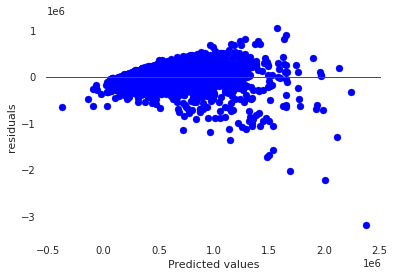

In [75]:
import scipy as sp

residuals = np.subtract(y_pred, y_test)

# describing the residual:
print(pd.DataFrame(residuals).describe())

residuals.mean()

test_result, p_value = sp.stats.bartlett(y_pred, residuals)

# compute the critical value of the chi squared distribution
degree_of_freedom = len(y_pred)-1
probability = 1 - p_value

critical_value = sp.stats.chi2.ppf(probability, degree_of_freedom)
print(critical_value)
print(p_value)

# If the test_result is greater than the critical value, then we reject our null
# hypothesis. This would mean that there are patterns to the variance of the data

# Otherwise, if we can identify no patterns, and we accept the null hypothesis that 
# the variance is homogeneous across our data

if (test_result > critical_value):
  print('the variances are unequal, and the model should be reassessed')
else:
  print('the variances are homogeneous!')

# plotting the residuals
plt.scatter(y_pred, residuals, color='blue')
plt.ylabel('residuals')
plt.xlabel('Predicted values')
plt.axhline(y= residuals.mean(), color='red', linewidth=1)
plt.show()

## Lasso regression 

In [81]:
import warnings
warnings.filterwarnings("ignore")

# split the dataset into x and y
x = hass.drop(['price'], axis=1)
y = hass['price'].values


# splitting the data into training and test datasets
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state=100)
parameters = {'alpha': np.concatenate((np.arange(0.1,2,0.1), np.arange(2, 5, 0.5), np.arange(5, 25, 1)))}
lasso = linear_model.Lasso()
gridlasso = GridSearchCV(lasso, parameters, scoring ='r2') 

# fit the model and printing the needed MSE and coeff
gridlasso.fit(x_train, y_train)
print('best parameters', gridlasso.best_params_)
print('best scores', gridlasso.score(x_test, y_test))
print('The models MSE is ', mean_squared_error(y_test, y_pred = gridlasso.predict(x_test)))
print('The best estimator is ', gridlasso.best_estimator_.coef_)

best parameters {'alpha': 0.1}
best scores 0.6545482597401725
The models MSE is  46618617120.0757
The best estimator is  [-3.84060373e+04  5.13713837e+04  2.94859375e+02 -5.50672683e-03
  2.65893331e+04  5.88368800e+05  4.17546850e+04  2.05317918e+04
  1.20855308e+05 -1.37412877e+02 -1.35467589e+02 -3.67028494e+03
  2.17025106e+01  2.42878754e+01 -5.10861440e-01]


The MSE of the model is 46,618,617,120.0757 and is worse than that of the multiple linear regression and also that of the ridge regression. 

Assessing the heteroskedasticity and plotting the residuals.

                  0
count  4.323000e+03
mean  -7.713815e+03
std    4.683609e+05
min   -6.385409e+06
25%   -2.128639e+05
50%    1.683311e+04
75%    2.385547e+05
max    1.860411e+06
inf
1.371750447287137e-212
the variances are homogeneous!


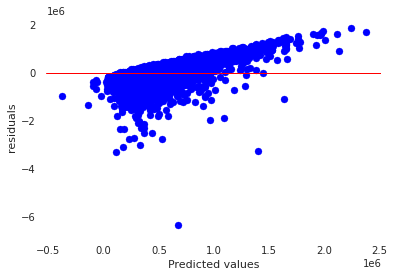

In [82]:
import scipy as sp

residuals = np.subtract(y_pred, y_test)

# describing the residual:
print(pd.DataFrame(residuals).describe())

residuals.mean()

test_result, p_value = sp.stats.bartlett(y_pred, residuals)

# compute the critical value of the chi squared distribution
degree_of_freedom = len(y_pred)-1
probability = 1 - p_value

critical_value = sp.stats.chi2.ppf(probability, degree_of_freedom)
print(critical_value)
print(p_value)

# If the test_result is greater than the critical value, then we reject our null
# hypothesis. This would mean that there are patterns to the variance of the data

# Otherwise, if we can identify no patterns, and we accept the null hypothesis that 
# the variance is homogeneous across our data

if (test_result > critical_value):
  print('the variances are unequal, and the model should be reassessed')
else:
  print('the variances are homogeneous!')

# plotting the residuals
plt.scatter(y_pred, residuals, color='blue')
plt.ylabel('residuals')
plt.xlabel('Predicted values')
plt.axhline(y= residuals.mean(), color='red', linewidth=1)
plt.show()

## Elastic Net regression 

In [76]:
# splitting the dataset
x = hass.drop(['price'], axis=1)
y = hass['price'].values

# setting the grid for the regression
from sklearn.linear_model import ElasticNet

elastic = ElasticNet(normalize=True)
search=GridSearchCV(estimator=elastic, param_grid={'alpha':np.logspace(-5, 2, 8),'l1_ratio':[.2,.4,.6,.8]},scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)

# fit the model and display the best parameters
search.fit(x,y)
print(search.best_params_)
abs(search.best_score_)

{'alpha': 1e-05, 'l1_ratio': 0.8}


47448223429.22212

The alpha for the model should be 1e-05 with an l1 ratio of 0.8. The model has a best possible MSE of 47,448,223,429.22212

In [77]:
# feeding the hyperparameters into the model and generating the coefficients
elastic= ElasticNet(normalize=True, alpha=1e-05, l1_ratio=0.8)
elastic.fit(x,y)
elastic_mse = (mean_squared_error(y_true=y, y_pred=elastic.predict(x)))
print('The MSE for the elastic model is ',elastic_mse)

coef_dict_baseline = {}
for coef, feat in zip(elastic.coef_,x.columns):
  coef_dict_baseline[feat] = coef
coef_dict_baseline


The MSE for the elastic model is  46862220870.76093


{'bathrooms': 44948.058410857826,
 'bedrooms': -34665.709478181765,
 'condition': 20329.314494415743,
 'floors': 27575.989315280953,
 'grade': 109203.07110033855,
 'sqft_above': 76.17866497641596,
 'sqft_basement': 83.29905055566198,
 'sqft_living': 81.2704608313701,
 'sqft_living15': 33.864585912550254,
 'sqft_lot': -0.0042212761251324395,
 'sqft_lot15': -0.5057761443254962,
 'view': 45388.37595031342,
 'waterfront': 562889.8892659878,
 'yr_built': -3291.9357851028353,
 'zipcode': 39.970481264378726}

The model has an MSE of 46,862,220,870.76093 an imporvement from the expected MSE obtained earlier but it is not a better predictor than the Multiple linear model that I had predicted earlier. 

assessing the heteroskedasticity using bartlets test

                  0
count  4.323000e+03
mean  -4.098802e+03
std    4.601884e+05
min   -6.444601e+06
25%   -2.026918e+05
50%    2.915503e+04
75%    2.475982e+05
max    1.594926e+06
inf
6.116466865283302e-245
the variances are homogeneous!


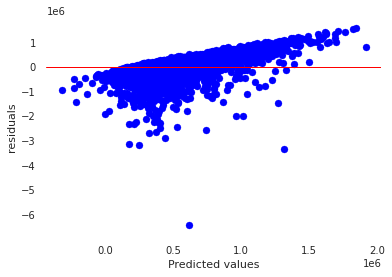

In [70]:
import scipy as sp

residuals = np.subtract(y_pred, y_test)

# describing the residual:
print(pd.DataFrame(residuals).describe())

residuals.mean()

test_result, p_value = sp.stats.bartlett(y_pred, residuals)

# compute the critical value of the chi squared distribution
degree_of_freedom = len(y_pred)-1
probability = 1 - p_value

critical_value = sp.stats.chi2.ppf(probability, degree_of_freedom)
print(critical_value)
print(p_value)

# If the test_result is greater than the critical value, then we reject our null
# hypothesis. This would mean that there are patterns to the variance of the data

# Otherwise, if we can identify no patterns, and we accept the null hypothesis that 
# the variance is homogeneous across our data

if (test_result > critical_value):
  print('the variances are unequal, and the model should be reassessed')
else:
  print('the variances are homogeneous!')

# plotting the residuals
plt.scatter(y_pred, residuals, color='blue')
plt.ylabel('residuals')
plt.xlabel('Predicted values')
plt.axhline(y= residuals.mean(), color='red', linewidth=1)
plt.show()

## Challenging the solution

The multiple linear regression has the lowest MSE and therefore is the best predictor. However Lasso regression also provides a robust model for predicting the prices of the houses. More data needs to be provided in order to train the model. There is a lot of skewness and the data also contains very many outliers. Therefore better attributes need to be provided to accurately predict the house prices. There are also ambiguous records in the dataset. For example in the bathroom column there are records of for example 1.28 bathrooms. These needs to be corrected for better model prediction.